<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Project 4a 

https://www.kaggle.com/competitions/predict-west-nile-virus/data

### Contents:
- [Background](#Background)
- [Data Import & Cleaning](#Data-Import-&-Cleaning)
- [Feature Engineering](#Feature-Engineering)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
- [Modeling](#Modeling)
- [Key Insights & Recommendations](#Conclusion)

# Background

### Datasets

### Problem Statement

### Project Goals

### Outside Research

# Data Import & Cleaning

In [265]:
import pandas as pd
import numpy as np
import os

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# Plotting and Display
from IPython.display import display, HTML
import matplotlib.pyplot as plt
import seaborn as sns

pd.options.display.max_columns = 100
plt.rcParams['figure.figsize']=(20,10)
plt.style.use('ggplot')

# create date parser
dateparse = lambda x: pd.datetime.strptime(x, '%Y-%m-%d')

current_directory = os.getcwd()
file_path = os.path.join(current_directory, '../assets/train.csv')
train_df = pd.read_csv(file_path, parse_dates=['Date'], date_parser=dateparse)

file_path = os.path.join(current_directory, '../assets/test.csv')
test_df = pd.read_csv(file_path, parse_dates=['Date'], date_parser=dateparse)

file_path = os.path.join(current_directory, '../assets/spray.csv')
spray_df = pd.read_csv(file_path, parse_dates=['Date'], date_parser=dateparse)

file_path = os.path.join(current_directory, '../assets/weather.csv')
weather_df = pd.read_csv(file_path, parse_dates=['Date'], date_parser=dateparse)

FileNotFoundError: [Errno 2] No such file or directory: 'c:\\Users\\jinji\\Desktop\\GA_J\\DSI-SG-37 - Copy\\clustering exercise\\../assets/train.csv'

In [ ]:
print('Train:\n')
print(train_df.info())

print('\nTest:\n')
print(test_df.info())

print('\nWeather:\n')
print(weather_df.info())

print('\nSpray:\n')
print(spray_df.info())

Train:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10506 entries, 0 to 10505
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    10506 non-null  datetime64[ns]
 1   Address                 10506 non-null  object        
 2   Species                 10506 non-null  object        
 3   Block                   10506 non-null  int64         
 4   Street                  10506 non-null  object        
 5   Trap                    10506 non-null  object        
 6   AddressNumberAndStreet  10506 non-null  object        
 7   Latitude                10506 non-null  float64       
 8   Longitude               10506 non-null  float64       
 9   AddressAccuracy         10506 non-null  int64         
 10  NumMosquitos            10506 non-null  int64         
 11  WnvPresent              10506 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int6

### Handling Missing/Duplicated Data

In [ ]:
# Checking for null values
print("Train:\n", train_df.isna().sum().sum())
print("Test:\n", test_df.isna().sum().sum())
print("Weather:\n", weather_df.isna().sum().sum())

Train:
 0
Test:
 0
Weather:
 0


In [ ]:
# Checking for duplicate values
print("Train:\n", train_df.duplicated().sum()[train_df.duplicated().sum() > 0])
print("Test:\n", test_df.duplicated().sum()[test_df.duplicated().sum() > 0])
print("Weather:\n", weather_df.duplicated().sum()[weather_df.duplicated().sum() > 0])

Train:
 [813]
Test:
 []
Weather:
 []


The 813 duplicated rows in train_df could be attributed to:

"These test results are organized in such a way that when the number of mosquitos exceed 50, they are split into another record (another row in the dataset), such that the number of mosquitos are capped at 50."
(Source: https://www.kaggle.com/competitions/predict-west-nile-virus/data)

Hence, we will not drop the duplicated rows.

### 1) Weather dataset

There are no null values in the datasets above. However, for the `weather_df` dataset, notations such as '-', '  T' and 'M' are observed under columns that should contain numerical data. 

Based on the noaa_weather_qclcd_documentation.pdf:
- '  T' = TRACE 
    - In meteorology, a trace denotes an amount of precipitation, such as rain or snow, that is greater than zero, but is too small to be measured by standard units or methods of measurement.
(Source: https://en.wikipedia.org/wiki/Trace_(precipitation))
- 'M' = MISSING DATA
- '-'


#### Data Cleaning Summary of Changes

**Weather Dataset**

Dropped:
- Water1, Depth, SnowFall due to close to 100% missing values

Imputed Missing Values of:
- `Tavg` from average of Tmax and Tmin
- Heat, Cool from Tavg
- `Depart`, `Sunrise`, `Sunset`, `AvgSpeed`, `PrecipTotal` from Station 1 values of  same date
- `Depart` - 'T' (Trace values) replaced with 0.005.
- `WetBulb`, `StnPressure`, `SeaLevel ` from the day before at the same Station.

Created:
- n_codesum: Number of exceptional weather phenomena based on CodeSum
- snow, windy, rain, lowvis: weather categories based on CodeSum

Others:
- Merged Station 1 and Station 2 by averaging values of each station
- Added Year, Month, Week and Day of Week features


In [ ]:
#Checking for unqiue values for each column

for column in weather_df.columns:
    unique_values = weather_df[column].unique()
    print(f"Unique values in {column}: {unique_values}")

Unique values in Station: [1 2]
Unique values in Date: ['2007-05-01T00:00:00.000000000' '2007-05-02T00:00:00.000000000'
 '2007-05-03T00:00:00.000000000' ... '2014-10-29T00:00:00.000000000'
 '2014-10-30T00:00:00.000000000' '2014-10-31T00:00:00.000000000']
Unique values in Tmax: [ 83  84  59  60  66  67  78  68  82  80  77  76  70  73  64  65  69  90
  62  61  71  79  87  89  88  75  85  86  81  72  63  91  92  93  74  94
  54  53  56  57  58  55  50  95  52  47  45  51  48  44  49  46  96  99
 100 101  97  98 102 103 104  42  41]
Unique values in Tmin: [50 52 42 43 46 48 49 51 53 54 47 60 61 63 56 59 44 57 45 55 66 65 70 68
 62 67 64 58 71 69 73 75 72 74 39 41 40 37 34 38 35 36 33 31 32 76 77 29
 78 79 80 81 82 83]
Unique values in Tavg: ['67' '68' '51' '52' '56' '58' 'M' '60' '59' '65' '70' '69' '71' '61' '55'
 '57' '73' '72' '53' '62' '63' '74' '75' '78' '76' '77' '66' '80' '64'
 '81' '82' '79' '85' '84' '83' '50' '49' '46' '48' '45' '54' '47' '44'
 '40' '41' '38' '39' '42' '37' '43' 

The columns below will be dropped due to close to 100% of missing values.
- Unique values in Depth: ['0' 'M']
- Unique values in Water1: ['M']
- Unique values in SnowFall: ['0.0' 'M' '  T' '0.1']

In [ ]:
weather_df.drop(['Depth','Water1','SnowFall'],axis=1, inplace=True)

In [ ]:
# Total counts of M, -, T

miss_weather = ['M', '-']
trace_weather = ['  T']

cols_not_date = [col for col in weather_df.columns if col != 'Date']
weather_df[cols_not_date].apply(pd.value_counts, axis=1)[miss_weather + trace_weather].fillna(0).sum()

M      1527.0
-      2944.0
  T     318.0
dtype: float64

In [ ]:
# Check total number of rows that contains M , - , T

# Check rows containing any of the values
mask = weather_df[cols_not_date].isin(miss_weather + trace_weather).any(axis=1)
rows_with_values = weather_df[mask]

# Count the number of rows
num_rows_with_values = len(rows_with_values)
display(num_rows_with_values)

1642

The weather dataset only has 2944 rows. 1642 rows with non-numerical notations takes up a significant proportion of the dataset (55.7%). Hence, these rows will not be dropped.

In [ ]:
# M , - , T counts for each column

print('Station 1')
weather_df_check = weather_df[weather_df['Station']==1]
check = weather_df_check[cols_not_date].apply(pd.value_counts, axis=0).fillna(0)
display(check.loc[['M', '  T']]) # Station 1 has no rows with '-'

print('Station 2')
weather_df_check = weather_df[weather_df['Station']==2]
check = weather_df_check[cols_not_date].apply(pd.value_counts, axis=0).fillna(0)
display(check.loc[['M', '-', '  T']]) 

Station 1


,Station,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,CodeSum,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
M,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,5.0,0.0,0.0,0.0
T,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,163.0,0.0,0.0,0.0,0.0,0.0


Station 2


,Station,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,CodeSum,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
M,0.0,0.0,0.0,11.0,1472.0,0.0,1.0,11.0,11.0,0.0,0.0,0.0,2.0,2.0,4.0,0.0,0.0,3.0
-,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1472.0,1472.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
T,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,155.0,0.0,0.0,0.0,0.0,0.0


#### Imputation of Missing Values ('M','-')

- `Tavg`, `Heat`, `Cool`: These values can be imputed based on the other features in the same row.
- `Depart`, `Sunrise`, `Sunset`, `AvgSpeed`, `PrecipTotal`: These values are only missing ('M') in Station 2. It is assumed that these values have minimal differences between the 2 stations, and hence can be imputated based on Station 1 by using foward-fill.
- `WetBulb`,  , `StnPressure`, `SeaLevel`: These values are missing in both Station 1 and Station 2, hence, values from the day before will be imputed.

**`Tavg`, `Heat`, `Cool`**

In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Station      2944 non-null   int64         
 1   Date         2944 non-null   datetime64[ns]
 2   Tmax         2944 non-null   int64         
 3   Tmin         2944 non-null   int64         
 4   Tavg         2944 non-null   object        
 5   Depart       2944 non-null   object        
 6   DewPoint     2944 non-null   int64         
 7   WetBulb      2944 non-null   object        
 8   Heat         2944 non-null   object        
 9   Cool         2944 non-null   object        
 10  Sunrise      2944 non-null   object        
 11  Sunset       2944 non-null   object        
 12  CodeSum      2944 non-null   object        
 13  PrecipTotal  2944 non-null   object        
 14  StnPressure  2944 non-null   object        
 15  SeaLevel     2944 non-null   object        
 16  Result

In [ ]:
# Can be taken from other data in the same row.

def impute_from_same_row(row):

    if row['Tavg'] == 'M':
        row['Tavg'] = round((row['Tmax'] + row['Tmin']) / 2)

    if row['Cool'] == 'M' or row['Heat'] == 'M':
        val = 65 - row['Tavg']
        if val < 0:
            row['Cool'] = val
            row['Heat'] = 0
        elif val > 0:
            row['Cool'] = 0
            row['Heat'] = val
        else:
            row['Cool'] = row['Heat'] = 0
    return row

In [ ]:
weather_df = weather_df.apply(impute_from_same_row, axis=1)

In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Station      2944 non-null   int64         
 1   Date         2944 non-null   datetime64[ns]
 2   Tmax         2944 non-null   int64         
 3   Tmin         2944 non-null   int64         
 4   Tavg         2944 non-null   object        
 5   Depart       2944 non-null   object        
 6   DewPoint     2944 non-null   int64         
 7   WetBulb      2944 non-null   object        
 8   Heat         2944 non-null   object        
 9   Cool         2944 non-null   object        
 10  Sunrise      2944 non-null   object        
 11  Sunset       2944 non-null   object        
 12  CodeSum      2944 non-null   object        
 13  PrecipTotal  2944 non-null   object        
 14  StnPressure  2944 non-null   object        
 15  SeaLevel     2944 non-null   object        
 16  Result

**`Depart`, `Sunrise`, `Sunset`, `AvgSpeed`, `PrecipTotal`**

In [ ]:
def calculate_depart(row):
    if row['Depart'] == 'M':
        # Get the previous row's 'Tavg' and 'Depart' values
        prev_tavg = weather_df.loc[row.name - 1, 'Tavg']
        prev_depart = weather_df.loc[row.name - 1, 'Depart']
        # Calculate the difference between 'Tavg' and 'Depart'
        depart_diff = int(prev_tavg) - int(prev_depart)
        return depart_diff
    else:
        return row['Depart']

weather_df['Depart'] = weather_df.apply(calculate_depart, axis=1)


In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Station      2944 non-null   int64         
 1   Date         2944 non-null   datetime64[ns]
 2   Tmax         2944 non-null   int64         
 3   Tmin         2944 non-null   int64         
 4   Tavg         2944 non-null   object        
 5   Depart       2944 non-null   object        
 6   DewPoint     2944 non-null   int64         
 7   WetBulb      2944 non-null   object        
 8   Heat         2944 non-null   object        
 9   Cool         2944 non-null   object        
 10  Sunrise      2944 non-null   object        
 11  Sunset       2944 non-null   object        
 12  CodeSum      2944 non-null   object        
 13  PrecipTotal  2944 non-null   object        
 14  StnPressure  2944 non-null   object        
 15  SeaLevel     2944 non-null   object        
 16  Result

In [ ]:
weather_df[['Sunrise', 'Sunset']] = weather_df[['Sunrise', 'Sunset']].replace('-', np.NaN)
weather_df[['AvgSpeed','PrecipTotal']] = weather_df[['AvgSpeed', 'PrecipTotal']].replace('M', np.NaN)

weather_df[['Sunrise', 'Sunset', 'AvgSpeed','PrecipTotal']] = weather_df[['Sunrise', 'Sunset', 'AvgSpeed','PrecipTotal']].fillna(method='ffill')

In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Station      2944 non-null   int64         
 1   Date         2944 non-null   datetime64[ns]
 2   Tmax         2944 non-null   int64         
 3   Tmin         2944 non-null   int64         
 4   Tavg         2944 non-null   object        
 5   Depart       2944 non-null   object        
 6   DewPoint     2944 non-null   int64         
 7   WetBulb      2944 non-null   object        
 8   Heat         2944 non-null   object        
 9   Cool         2944 non-null   object        
 10  Sunrise      2944 non-null   object        
 11  Sunset       2944 non-null   object        
 12  CodeSum      2944 non-null   object        
 13  PrecipTotal  2944 non-null   object        
 14  StnPressure  2944 non-null   object        
 15  SeaLevel     2944 non-null   object        
 16  Result

**`WetBulb`, `StnPressure`, `SeaLevel`**

In [ ]:
weather_df[weather_df['WetBulb'].isna()]

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,Sunrise,Sunset,CodeSum,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed


In [ ]:
# columns_to_replace = ['WetBulb', 'StnPressure', 'SeaLevel']

# for column in columns_to_replace:
#     weather_df[column] = weather_df[column].replace('M', pd.NA)  # Replace 'M' with missing value
#     weather_df[column] = pd.to_numeric(weather_df[column], errors='coerce')  # Convert the column to numeric type

#     # Forward fill missing values for Station 1
#     mask = (weather_df['Station'] == 1)
#     weather_df.loc[mask, column].fillna(method='ffill', inplace=True)

#     # Forward fill missing values for Station 2
#     mask = (weather_df['Station'] == 2)
#     weather_df.loc[mask, column].fillna(method='ffill', inplace=True)

In [ ]:
columns_to_replace = ['WetBulb', 'StnPressure', 'SeaLevel']

for column in columns_to_replace:
    weather_df[column] = weather_df[column].replace('M', pd.NA)  # Replace 'M' with missing value
    weather_df[column] = pd.to_numeric(weather_df[column], errors='coerce')  # Convert the column to numeric type

    # Forward fill missing values for both stations
    weather_df[column].fillna(method='ffill', inplace=True)

In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Station      2944 non-null   int64         
 1   Date         2944 non-null   datetime64[ns]
 2   Tmax         2944 non-null   int64         
 3   Tmin         2944 non-null   int64         
 4   Tavg         2944 non-null   object        
 5   Depart       2944 non-null   object        
 6   DewPoint     2944 non-null   int64         
 7   WetBulb      2944 non-null   float64       
 8   Heat         2944 non-null   object        
 9   Cool         2944 non-null   object        
 10  Sunrise      2944 non-null   object        
 11  Sunset       2944 non-null   object        
 12  CodeSum      2944 non-null   object        
 13  PrecipTotal  2944 non-null   object        
 14  StnPressure  2944 non-null   float64       
 15  SeaLevel     2944 non-null   float64       
 16  Result

#### Imputation of 'Trace' Values

- `PrecipTotal`: '  T' will be replaced by 0.005 since traces of rainfall may impact mosquito breeding 
    - *"If precipitation is observed but the amount falling into the gauge is less than half of the first graduated mark (0.01”), “T” or Trace is recorded for the precipitation quantity." (Source: https://stateclimate.org/pdfs/journal-articles/2013_Adnan_et_al_2013.pdf)*

**`PrecipTotal`**

In [ ]:
weather_df['PrecipTotal'] = weather_df['PrecipTotal'].replace('  T', 0.005)

In [ ]:
#Checking if all 'M', '-' and 'T' has been changed.


# Check rows containing any of the values
mask = weather_df[cols_not_date].isin(miss_weather + trace_weather).any(axis=1)
rows_with_values = weather_df[mask]

# Count the number of rows
num_rows_with_values = len(rows_with_values)
print(num_rows_with_values)

0


### Handling Incorrect  Datatypes / Invalid Data

'Sunset' column has entries with xx60. This is invalid since the value xx59 should increment to the next hour xx00 instead of xx60. 

In [ ]:
weather_df.loc[19:23, 'Sunset']

19    1859
20    1860
21    1860
22    1901
23    1901
Name: Sunset, dtype: object

In [ ]:
counter = 0
tracker = []
for index, val in enumerate(weather_df.Sunset):
    try:
        pd.to_datetime(val, format = '%H%M').time()
    except:
        counter += 1
        tracker.append((index, val, val[2:], counter))

print(tracker[-1])

(2925, '1660', '60', 48)


In [ ]:
# Decrment by 1 for each invalid instance
weather_df.Sunset = weather_df.Sunset.replace('\+?60', '59', regex = True)

In [ ]:
weather_df.Sunset.unique()

array(['1849', '1850', '1851', '1852', '1853', '1855', '1856', '1857',
       '1858', '1859', '1901', '1902', '1903', '1904', '1905', '1906',
       '1907', '1908', '1909', '1910', '1911', '1912', '1913', '1914',
       '1915', '1916', '1917', '1918', '1919', '1920', '1921', '1922',
       '1923', '1924', '1925', '1926', '1927', '1928', '1929', '1930',
       '1931', '1900', '1854', '1848', '1846', '1845', '1843', '1842',
       '1840', '1839', '1837', '1835', '1834', '1832', '1831', '1829',
       '1827', '1826', '1824', '1822', '1821', '1819', '1817', '1815',
       '1814', '1812', '1810', '1809', '1807', '1805', '1803', '1759',
       '1758', '1756', '1755', '1753', '1751', '1749', '1748', '1746',
       '1744', '1742', '1741', '1739', '1737', '1735', '1734', '1732',
       '1730', '1729', '1727', '1725', '1724', '1722', '1720', '1719',
       '1717', '1715', '1714', '1712', '1711', '1709', '1707', '1706',
       '1704', '1703', '1701', '1659', '1658', '1657', '1656', '1654',
      

Note that I did not convert Sunrise and Sunset into datetime format. 

Another possible approach: Engineer DayLength and NightLength data, etc

**`CodeSum`**

In [ ]:
# Ensuring that each code has proper spacing
codes = ['+FC','FC', 'TS', 'GR', 'RA', 'DZ', 'SN', 'SG', 'GS', 'PL',
         'IC', 'FG+', 'FG', 'BR', 'UP', 'HZ', 'FU', 'VA', 'DU', 'DS',
         'PO', 'SA', 'SS', 'PY', 'SQ', 'DR', 'SH', 'FZ', 'MI', 'PR',
         'BC', 'BL', 'VC']
weather_df['CodeSum'] = weather_df['CodeSum'].apply(lambda x: ' '.join([t for t in x.split(' ') if t in codes]))

In [ ]:
weather_df['n_codesum'] = weather_df['CodeSum'].apply(lambda x: len(x.split()))

In [ ]:
snow = ['SN', 'SG', 'GS', 'PL', 'IC', 'DR', 'BC']
windy = ['SQ', 'DS', 'SS', 'PO', 'BL']
rain = ['TS', 'GR', 'RA', 'DZ', 'SH']
lowvis = ['FG+', 'FG', 'BR', 'HZ']
codesum_others = ['UP', 'VA', 'DU', 'SA', 'FZ']

In [ ]:
def codesum_split(row):
    codes = row['CodeSum'].split()
    
    # Check for weather conditions
    if any(code in codes for code in snow):
        row['snow'] = 1
    if any(code in codes for code in windy):
        row['windy'] = 1 
    if any(code in codes for code in rain):
        row['rain'] = 1 
    if any(code in codes for code in lowvis):
        row['lowvis'] = 1
    if any(code in codes for code in codesum_others):
        row['codesum_others'] = 1
        
    return row

In [ ]:
weather_df = weather_df.apply(codesum_split, axis=1)
weather_df = weather_df.fillna(0)
weather_df[['snow', 'windy', 'rain', 'lowvis']].sum()

snow         6.0
windy        3.0
rain      1007.0
lowvis     882.0
dtype: float64

In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 24 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   AvgSpeed     2944 non-null   object        
 1   CodeSum      2944 non-null   object        
 2   Cool         2944 non-null   object        
 3   Date         2944 non-null   datetime64[ns]
 4   Depart       2944 non-null   object        
 5   DewPoint     2944 non-null   int64         
 6   Heat         2944 non-null   object        
 7   PrecipTotal  2944 non-null   object        
 8   ResultDir    2944 non-null   int64         
 9   ResultSpeed  2944 non-null   float64       
 10  SeaLevel     2944 non-null   float64       
 11  Station      2944 non-null   int64         
 12  StnPressure  2944 non-null   float64       
 13  Sunrise      2944 non-null   object        
 14  Sunset       2944 non-null   object        
 15  Tavg         2944 non-null   object        
 16  Tmax  

In [ ]:
# convert datatpypes from object to int

to_numeric = ['Tavg', 'Depart', 'WetBulb', 'Heat', 'Cool', 'Sunrise', 'Sunset', 'PrecipTotal', 'StnPressure', 'SeaLevel', 'AvgSpeed']

for col in to_numeric:
    weather_df[col]= pd.to_numeric(weather_df[col])

<Axes: xlabel='CodeSum'>

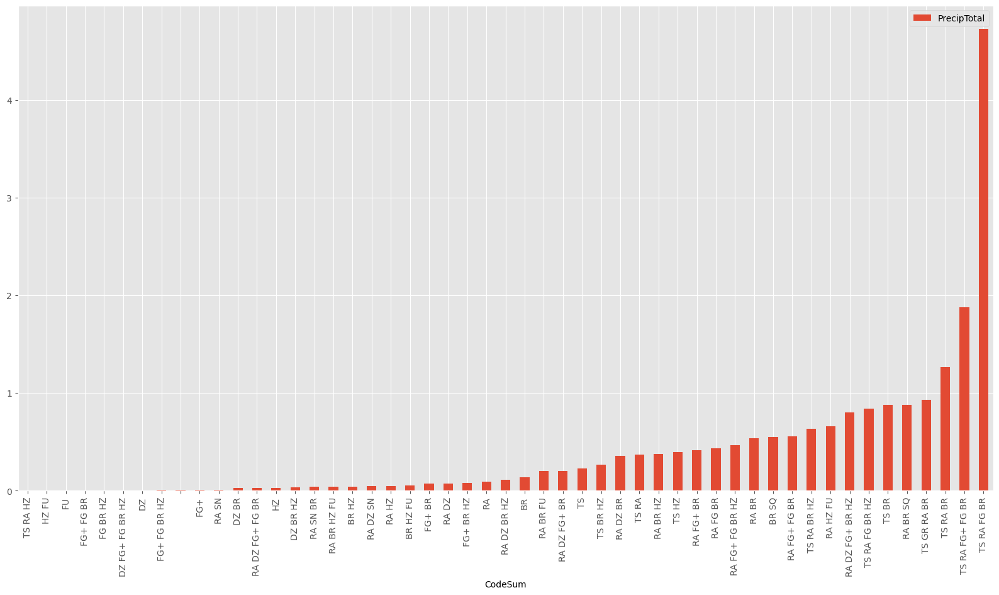

In [ ]:
weather_df.groupby('CodeSum')[['PrecipTotal']].mean().sort_values(by='PrecipTotal').plot(kind='bar')

### Merge Station 1 and Station 2

In the weather dataset, each unique date has 2 data entries - one for each station - Station = 1 and Station = 2.

To merge with the train dataset later on, We will take the aggregate (mean) values from both stations for the numerical values in weather dataset:

In [ ]:
weather_df = weather_df.groupby('Date').sum() / 2
weather_df = weather_df.drop(columns=['Station']).reset_index()

C:\Users\jinji\AppData\Local\Temp\ipykernel_27020\2692279946.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  weather_df = weather_df.groupby('Date').sum() / 2


In [ ]:
# Add Year, Month, Week and Day of Week features
# weather_df['Date'] = pd.to_datetime(weather['Date'])
weather_df['Year'] = weather_df['Date'].apply(lambda x: x.year)
weather_df['Month'] = weather_df['Date'].apply(lambda x: x.month)
weather_df['Week'] = weather_df['Date'].apply(lambda x: x.week)
weather_df['DayOfWeek'] = weather_df['Date'].apply(lambda x: x.dayofweek)
weather_df['DayOfYear'] = weather_df['Date'].apply(lambda x: x.dayofyear)

### 2) Train dataset

In [ ]:
# Dropping 'Address', 'AddressNumberAndStreet' - repeated information as Block, Street, Latitude, Longitude information are present
train_df.drop(['Address', 'AddressNumberAndStreet','AddressAccuracy'], axis=1,inplace=True)

In [ ]:
# Create integer latitude and longitude columns
train_df['Lat_int'] = train_df.Latitude.apply(int)
train_df['Long_int'] = train_df.Longitude.apply(int)
train_df['Lat_int'] = train_df.Latitude.apply(int)
train_df['Long_int'] = train_df.Longitude.apply(int)

In [ ]:
train_df.describe()

,Block,Latitude,Longitude,NumMosquitos,WnvPresent,Lat_int,Long_int
count,10506.000000,10506.000000,10506.000000,10506.000000,10506.000000,10506.000000,10506.0
mean,35.687797,41.841139,-87.699908,12.853512,0.052446,41.038930,-87.0
std,24.339468,0.112742,0.096514,16.133816,0.222936,0.193438,0.0
min,10.000000,41.644612,-87.930995,1.000000,0.000000,41.000000,-87.0
25%,12.000000,41.732984,-87.760070,2.000000,0.000000,41.000000,-87.0
50%,33.000000,41.846283,-87.694991,5.000000,0.000000,41.000000,-87.0
75%,52.000000,41.954690,-87.627796,17.000000,0.000000,41.000000,-87.0
max,98.000000,42.017430,-87.531635,50.000000,1.000000,42.000000,-87.0


### Merge weather and train dataset 

This merged dataset will be used for model training after feature engineering.

In [ ]:
master_df = pd.merge(train_df, weather_df, on='Date', how='left')

# Exploratory Data Analysis

### Weather and Train datasets

C:\Users\jinji\AppData\Local\Temp\ipykernel_27020\180943968.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = master_df.corr()[['WnvPresent']].sort_values(ascending=False, by='WnvPresent')


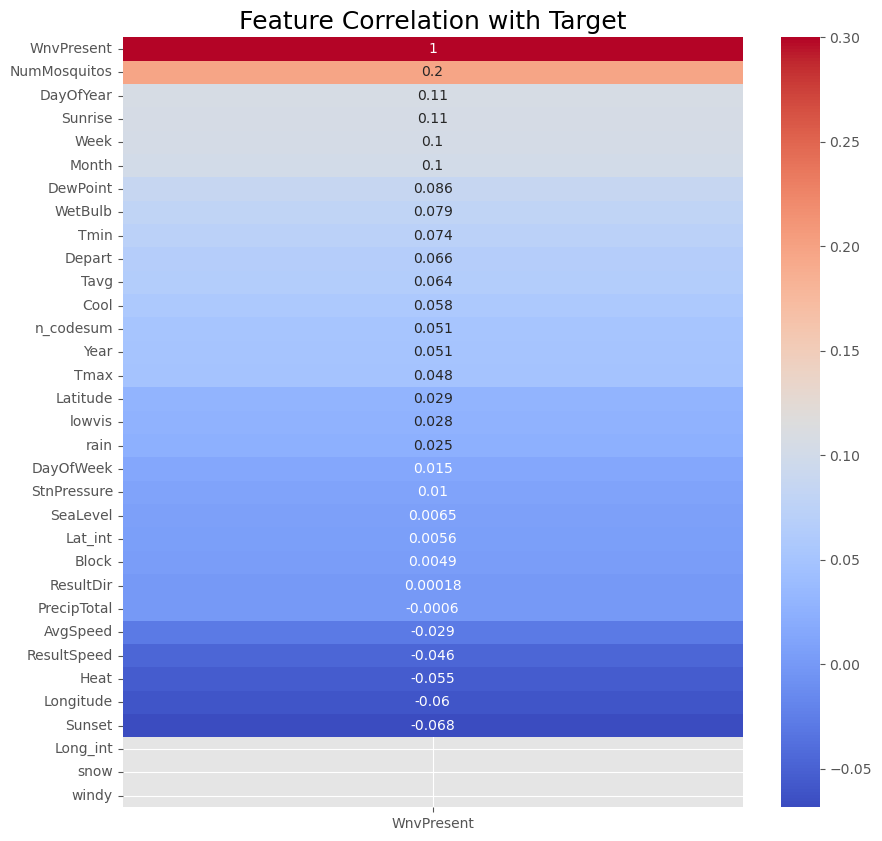

In [ ]:
corr = master_df.corr()[['WnvPresent']].sort_values(ascending=False, by='WnvPresent')
plt.figure(figsize=(10,10))
sns.heatmap(corr, cmap='coolwarm', annot=True, vmax=0.3)
plt.title('Feature Correlation with Target', fontsize=18);

C:\Users\jinji\AppData\Local\Temp\ipykernel_27020\2989136133.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(master_df.corr().sort_values(by='WnvPresent'), cmap='coolwarm', annot=True, vmax=0.3)


<Axes: >

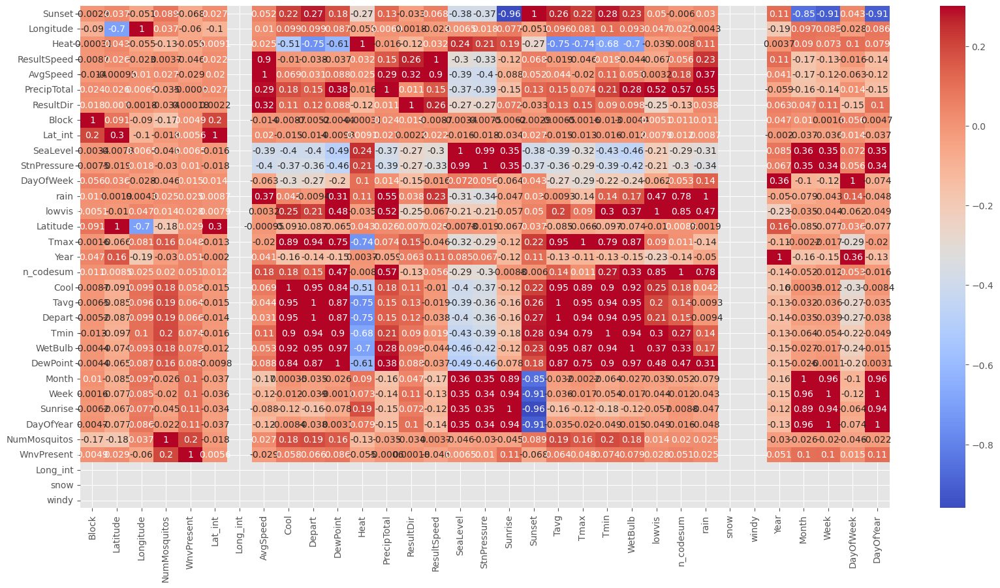

In [ ]:
sns.heatmap(master_df.corr().sort_values(by='WnvPresent'), cmap='coolwarm', annot=True, vmax=0.3)

C:\Users\jinji\AppData\Local\Temp\ipykernel_27020\848384764.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  group_df = master_df.groupby(by='Week').sum().reset_index()


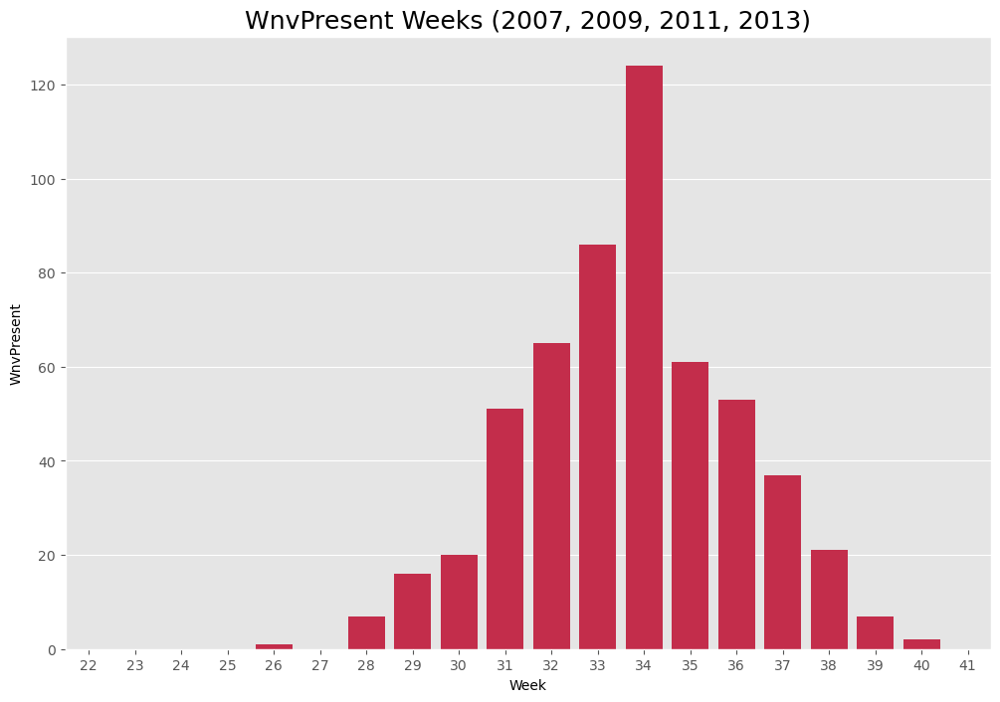

In [ ]:
plt.figure(figsize=(12,8))
group_df = master_df.groupby(by='Week').sum().reset_index()
sns.barplot(data=group_df, x='Week', y='WnvPresent', color='crimson')
plt.title('WnvPresent Weeks (2007, 2009, 2011, 2013)', fontsize=18);

C:\Users\jinji\AppData\Local\Temp\ipykernel_27020\2076541639.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  group_df_week = master_df.groupby('Week').sum().reset_index()
C:\Users\jinji\AppData\Local\Temp\ipykernel_27020\2076541639.py:9: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  group_df_year = master_df.groupby('Year').sum().reset_index()
C:\Users\jinji\AppData\Local\Temp\ipykernel_27020\2076541639.py:14: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns wh

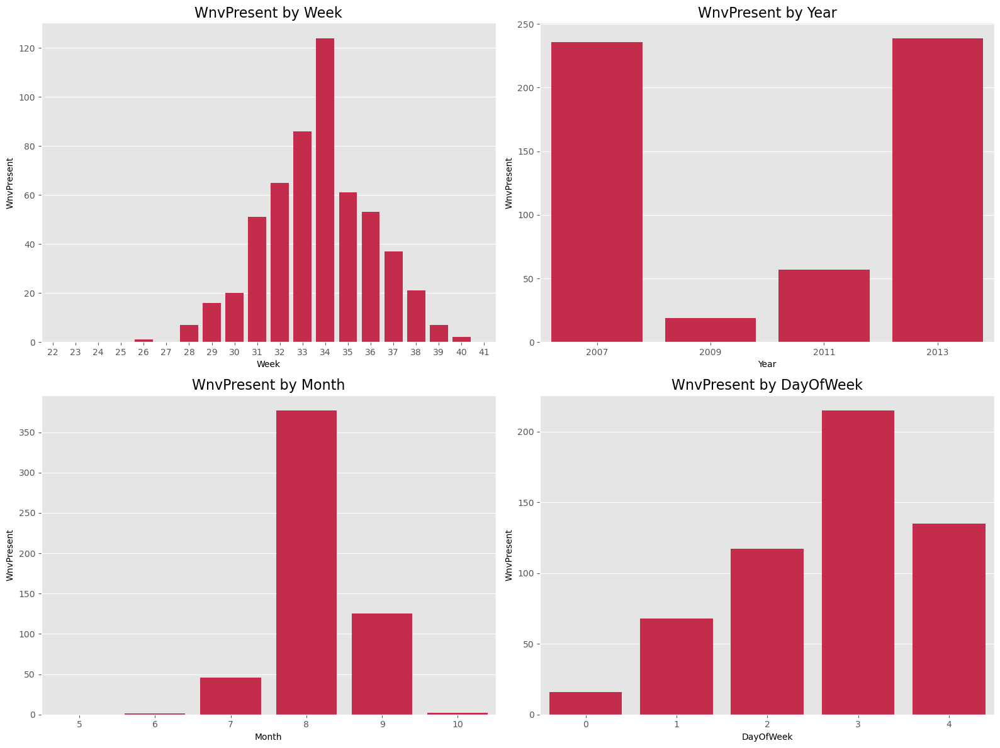

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

# Group by 'Week'
group_df_week = master_df.groupby('Week').sum().reset_index()
sns.barplot(data=group_df_week, x='Week', y='WnvPresent', color='crimson', ax=axes[0, 0])
axes[0, 0].set_title('WnvPresent by Week', fontsize=16)

# Group by 'Year' 
group_df_year = master_df.groupby('Year').sum().reset_index()
sns.barplot(data=group_df_year, x='Year', y='WnvPresent', color='crimson', ax=axes[0, 1])
axes[0, 1].set_title('WnvPresent by Year', fontsize=16)

# Group by 'Month' 
group_df_month = master_df.groupby('Month').sum().reset_index()
sns.barplot(data=group_df_month, x='Month', y='WnvPresent', color='crimson', ax=axes[1, 0])
axes[1, 0].set_title('WnvPresent by Month', fontsize=16)

# Group by 'DayOfWeek'
group_df_dayofweek = master_df.groupby('DayOfWeek').sum().reset_index()
sns.barplot(data=group_df_dayofweek, x='DayOfWeek', y='WnvPresent', color='crimson', ax=axes[1, 1])
axes[1, 1].set_title('WnvPresent by DayOfWeek', fontsize=16)

plt.tight_layout()
plt.show()

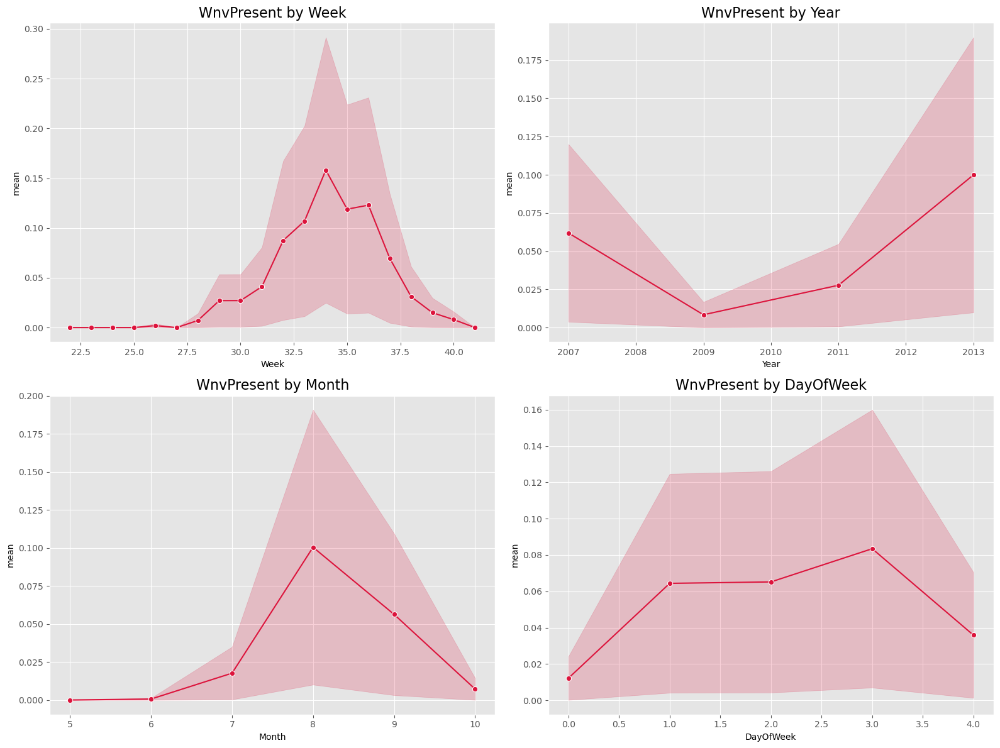

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

# Group by 'Week' and calculate mean and variance
group_df_week = master_df.groupby('Week')['WnvPresent'].agg(['mean', 'var']).reset_index()

# Plot line graph with shaded error bar
sns.lineplot(data=group_df_week, x='Week', y='mean', color='crimson', ax=axes[0, 0], marker='o')
axes[0, 0].fill_between(group_df_week['Week'], group_df_week['mean'] - group_df_week['var'], group_df_week['mean'] + group_df_week['var'], color='crimson', alpha=0.2)
axes[0, 0].set_title('WnvPresent by Week', fontsize=16)

# Group by 'Year' and calculate mean and variance
group_df_year = master_df.groupby('Year')['WnvPresent'].agg(['mean', 'var']).reset_index()

# Plot line graph with shaded error bar
sns.lineplot(data=group_df_year, x='Year', y='mean', color='crimson', ax=axes[0, 1], marker='o')
axes[0, 1].fill_between(group_df_year['Year'], group_df_year['mean'] - group_df_year['var'], group_df_year['mean'] + group_df_year['var'], color='crimson', alpha=0.2)
axes[0, 1].set_title('WnvPresent by Year', fontsize=16)

# Group by 'Month' and calculate mean and variance
group_df_month = master_df.groupby('Month')['WnvPresent'].agg(['mean', 'var']).reset_index()

# Plot line graph with shaded error bar
sns.lineplot(data=group_df_month, x='Month', y='mean', color='crimson', ax=axes[1, 0], marker='o')
axes[1, 0].fill_between(group_df_month['Month'], group_df_month['mean'] - group_df_month['var'], group_df_month['mean'] + group_df_month['var'], color='crimson', alpha=0.2)
axes[1, 0].set_title('WnvPresent by Month', fontsize=16)

# Group by 'DayOfWeek' and calculate mean and variance
group_df_dayofweek = master_df.groupby('DayOfWeek')['WnvPresent'].agg(['mean', 'var']).reset_index()

# Plot line graph with shaded error bar
sns.lineplot(data=group_df_dayofweek, x='DayOfWeek', y='mean', color='crimson', ax=axes[1, 1], marker='o')
axes[1, 1].fill_between(group_df_dayofweek['DayOfWeek'], group_df_dayofweek['mean'] - group_df_dayofweek['var'], group_df_dayofweek['mean'] + group_df_dayofweek['var'], color='crimson', alpha=0.2)
axes[1, 1].set_title('WnvPresent by DayOfWeek', fontsize=16)

plt.tight_layout()
plt.show()

                  Species  NumMosquitos  WnvPresent
0         CULEX ERRATICUS             7           0
1           CULEX PIPIENS         44671         240
2  CULEX PIPIENS/RESTUANS         66268         262
3          CULEX RESTUANS         23431          49
4        CULEX SALINARIUS           145           0
5          CULEX TARSALIS             7           0
6         CULEX TERRITANS           510           0


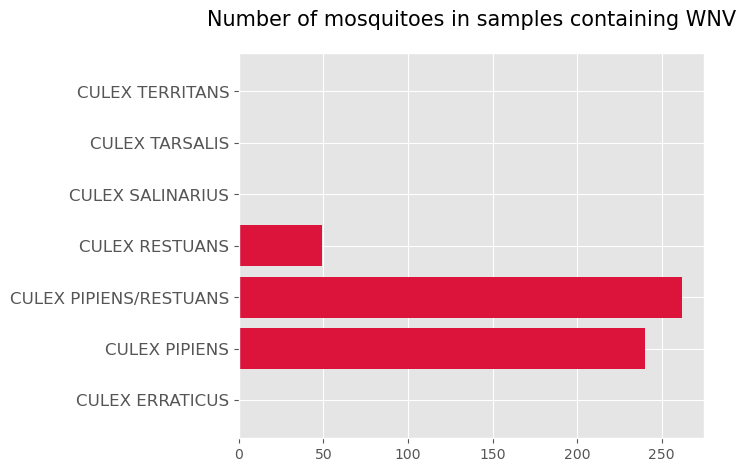

In [ ]:
mosquito_vs_wnv = master_df[['Species', 'NumMosquitos', 'WnvPresent']].groupby(by='Species').sum().reset_index()
print(mosquito_vs_wnv)

plt.figure(figsize=(6,5))
plt.barh(mosquito_vs_wnv['Species'], mosquito_vs_wnv['WnvPresent'], color='crimson')
plt.title('Number of mosquitoes in samples containing WNV', fontsize=15, y=1.05)
plt.yticks(fontsize=12)
plt.show()

EDA on the 'snow', 'windy', 'rain', 'lowvis', 'n_codesum' ...
[Not done yet]

<Axes: xlabel='n_codesum'>

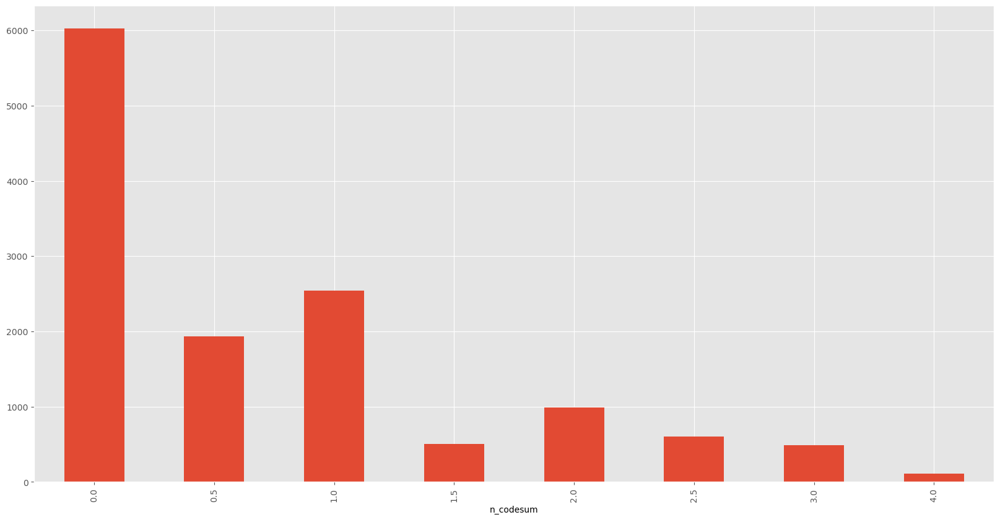

In [ ]:
master_df.groupby('lowvis')['WnvPresent'].count().plot(kind='bar')
master_df.groupby('n_codesum')['WnvPresent'].count().plot(kind='bar')

To have weather EDA

### Spray Dataset

In [ ]:
spray_df['Year'] = pd.to_datetime(spray_df['Date']).apply(lambda x: x.year)
spray_df['Week'] = pd.to_datetime(spray_df['Date']).apply(lambda x: x.week)

In [ ]:
spray_df

,Date,Time,Latitude,Longitude,Year,Week
0,2011-08-29,6:56:58 PM,42.391623,-88.089163,2011,35
1,2011-08-29,6:57:08 PM,42.391348,-88.089163,2011,35
2,2011-08-29,6:57:18 PM,42.391022,-88.089157,2011,35
3,2011-08-29,6:57:28 PM,42.390637,-88.089158,2011,35
4,2011-08-29,6:57:38 PM,42.390410,-88.088858,2011,35
...,...,...,...,...,...,...
14830,2013-09-05,8:34:11 PM,42.006587,-87.812355,2013,36
14831,2013-09-05,8:35:01 PM,42.006192,-87.816015,2013,36
14832,2013-09-05,8:35:21 PM,42.006022,-87.817392,2013,36
14833,2013-09-05,8:35:31 PM,42.005453,-87.817423,2013,36


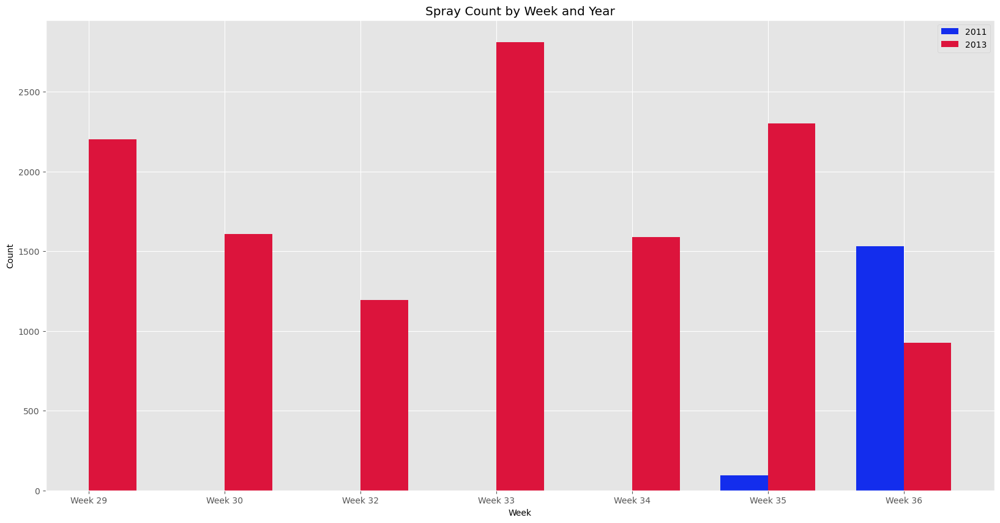

In [ ]:
# Pivot the spray_df to reshape the data
pivot_df = spray_df.pivot_table(index='Week', columns='Year', values='Time', aggfunc='count')

# Get the unique weeks
unique_weeks = pivot_df.index

# Set the width for each bar
bar_width = 0.35

# Set the positions of the bars on the x-axis
r1 = range(len(unique_weeks))
r2 = [x + bar_width for x in r1]

# Create the bar plot
plt.bar(r1, pivot_df[2011], color='#132ded', width=bar_width, label='2011')
plt.bar(r2, pivot_df[2013], color='crimson', width=bar_width, label='2013')

# Set the x-axis labels
plt.xlabel('Week')

# Set the y-axis label
plt.ylabel('Count')

# Set the title of the plot
plt.title('Spray Count by Week and Year')

# Set the x-axis tick positions and labels
plt.xticks([r + bar_width / 2 for r in range(len(unique_weeks))],
           [f'Week {week}' for week in unique_weeks])

# Display the legend
plt.legend()

# Show the plot
plt.show()


In [ ]:
def plot_mos_spray(year, bar=False):
    # Get unique week values from 'Week' column in spray_df
    unique_weeks = sorted(spray_df[spray_df['Year'] == year]['Week'].unique())

    # Count the number of rows for each unique 'Week' in spray_df
    spray_counts = spray_df[spray_df['Year'] == year].groupby('Week').size()

    # Group by 'Week' and calculate the sum of 'NumMosquitos' and 'WnvPresent'
    grouped_df = master_df[master_df['Year'] == year].groupby('Week').agg({'NumMosquitos': 'sum', 'WnvPresent': 'sum'}).reset_index()

    fig, ax1 = plt.subplots()

    # Create a second y-axis for 'NumMosquitos'
    ax2 = ax1.twinx()

    # Plot the sum of 'NumMosquitos'
    ax1.plot(grouped_df['Week'], grouped_df['NumMosquitos'], color='blue', label='NumMosquitos')
    ax1.set_xlabel('Week')
    ax1.set_ylabel('WnvPresent')
    ax1.yaxis.tick_left()  # Set y-axis ticks on the left
    ax1.yaxis.set_label_position('left')  # Set y-axis label on the left
    ax1.legend(loc='upper left')

    # Plot the sum of 'WnvPresent'
    ax2.plot(grouped_df['Week'], grouped_df['WnvPresent'], color='green', label='WnvPresent')
    ax2.set_ylabel('NumMosquitos')
    ax2.yaxis.tick_right()  # Set y-axis ticks on the right
    ax2.yaxis.set_label_position('right')  # Set y-axis label on the right
    ax2.legend(loc='upper right')

    ax1.set_title(f'Mosquitoes and WnvPresent in {year}, with Spray Data')

    if bar == True:

        # Create a third y-axis for 'Spray Counts'
        ax3 = ax2.twinx()
        bars = ax3.bar(spray_counts.index, spray_counts.values, color='crimson', alpha=0.3, label='Spray Counts')
        # ax3.set_ylabel('')
        # ax3.yaxis.tick_right()  # Set y-axis ticks on the right
        # ax3.yaxis.set_label_position('right')  # Set y-axis label on the right
        ax1.set_yticks([])
        ax3.legend(loc='upper center')
        ax3.grid(False)  # Remove grid lines

        for bar in bars:
            height = bar.get_height()
            ax3.text(bar.get_x() + bar.get_width() / 2, height, height, ha='center', va='bottom')

    else:
        # Draw vertical dotted lines at unique week values
        for week in unique_weeks:
            ax1.axvline(x=week, color='crimson', linestyle='dotted')
            ax2.axvline(x=week, color='crimson', linestyle='dotted')

    plt.show()


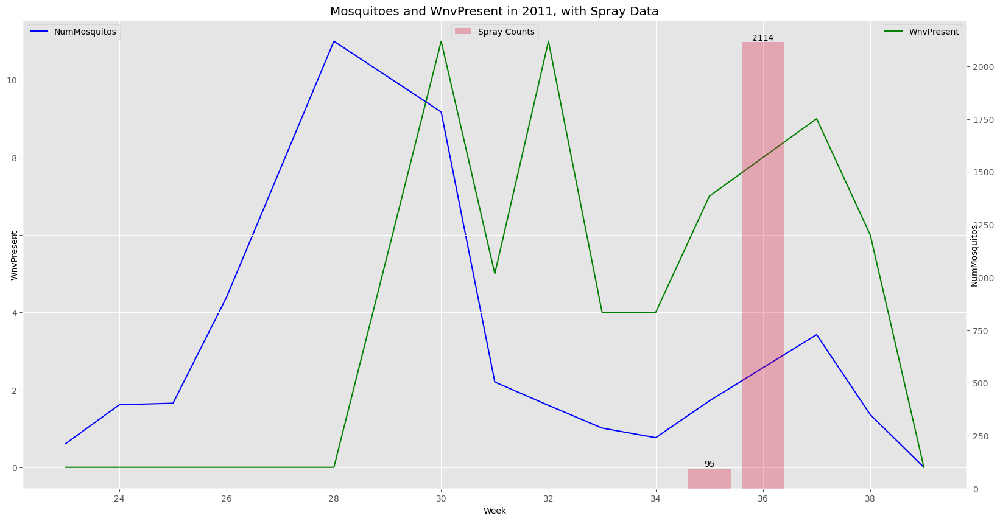

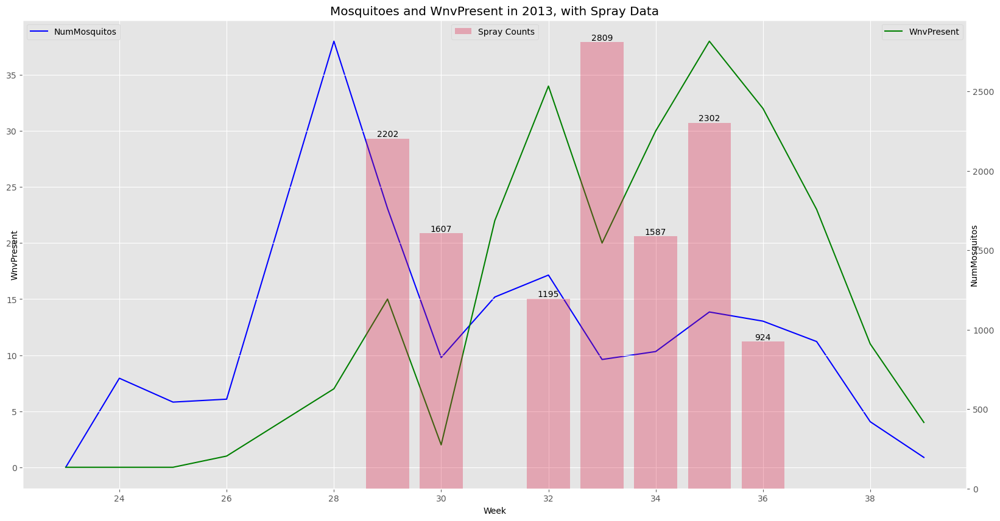

In [ ]:
# Change bar to False, to see dotted line instead
plot_mos_spray(2011, bar=True)
plot_mos_spray(2013, bar=True)

In [ ]:
import folium

# Map centered around the mean Latitude and Longitude values
map_center = [spray_df['Latitude'].mean(), spray_df['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=10)

for index, row in spray_df.iterrows():
    latitude = row['Latitude']
    longitude = row['Longitude']
    
    # Create a circle marker for each data point
    folium.CircleMarker(
        location=[latitude, longitude],
        radius=5,  
        color='blue', 
        fill=True,
        fill_color='blue'  
    ).add_to(m)

# Show WnvPresent points on the map if there are Wnv detected
positive_wnv_df = master_df[master_df['WnvPresent'] > 0]

# Varying size based on Wnv Count
for index, row in positive_wnv_df.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    wnv_present = row['WnvPresent']
    radius = wnv_present * 5  # Scaling factor 
    folium.CircleMarker(location=[lat, lon], radius=radius, color='red', fill=True, fill_color='red').add_to(m)

m

### Map Dataset

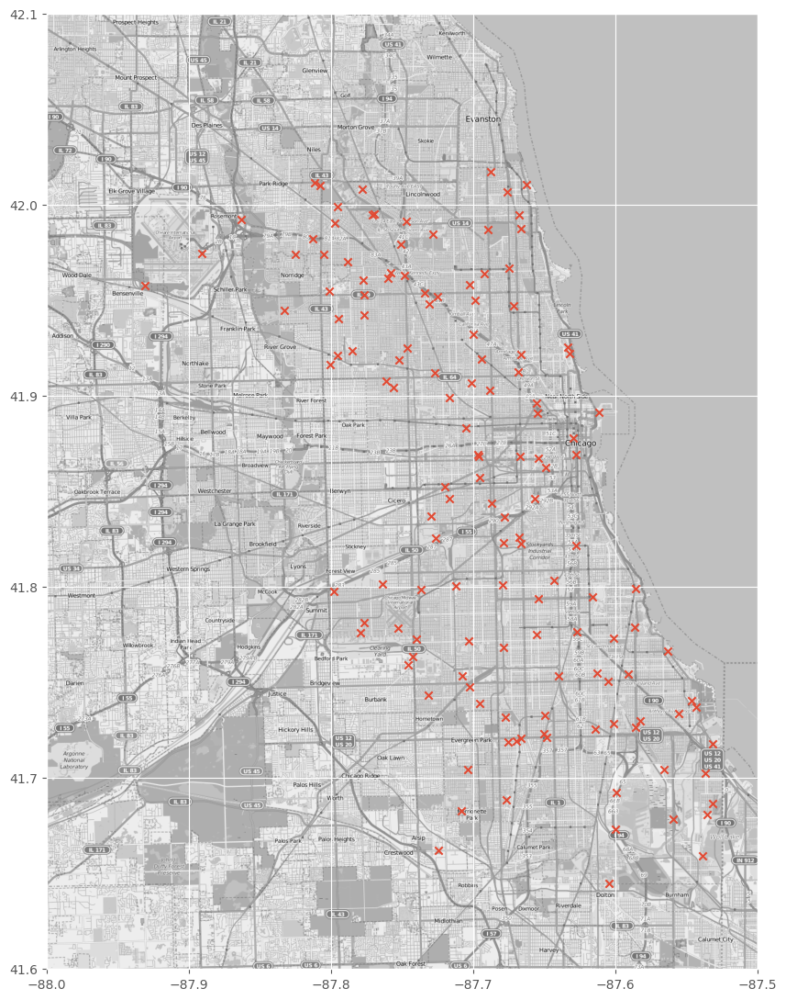

In [ ]:
mapdata = np.loadtxt("../assets/mapdata_copyright_openstreetmap_contributors.txt")
traps = master_df[['Date', 'Trap','Longitude', 'Latitude', 'WnvPresent']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

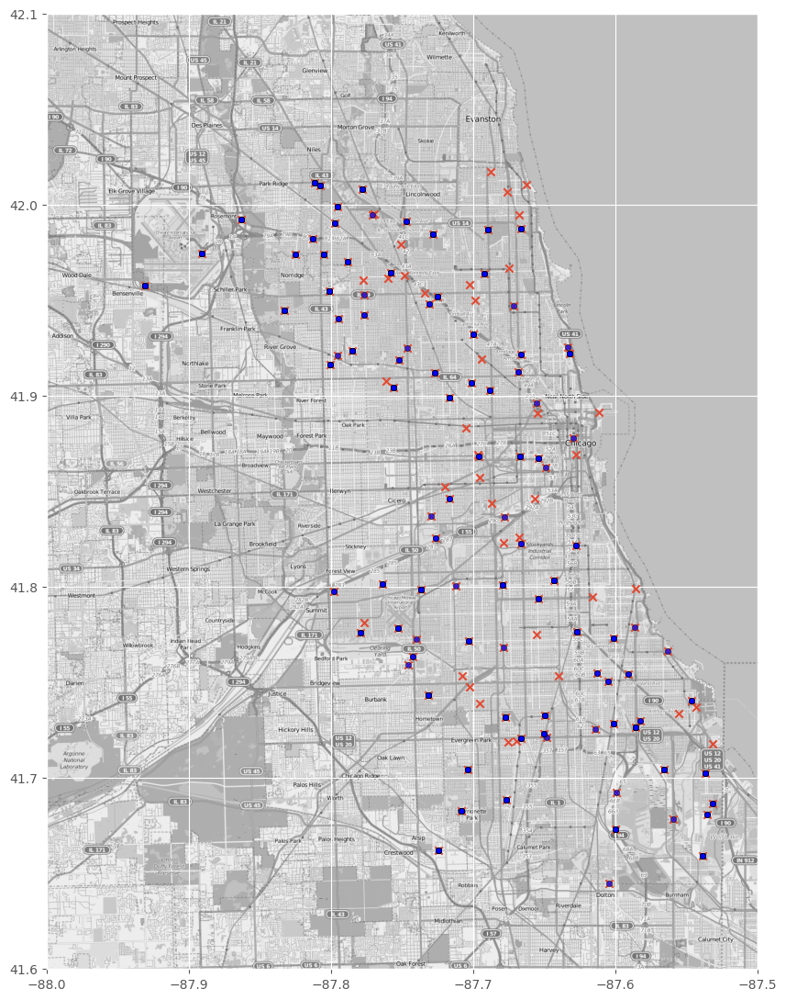

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

mapdata = np.loadtxt("../assets/mapdata_copyright_openstreetmap_contributors.txt")
traps = master_df[['Date', 'Trap', 'Longitude', 'Latitude', 'WnvPresent']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(10, 14))
plt.imshow(mapdata, cmap=plt.get_cmap('gray'), extent=lon_lat_box, aspect=aspect)

locations = traps[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:, 0], locations[:, 1], marker='x')

for index, row in traps.iterrows():
    lon = row['Longitude']
    lat = row['Latitude']
    wnv_present = row['WnvPresent']
    if wnv_present > 0:
        circle_size = wnv_present * 20
        circle_color = 'blue'
        circle_border_color = 'black'
        circle_alpha = 0.7
        plt.scatter(lon, lat, s=circle_size, color=circle_color, edgecolors=circle_border_color, alpha=circle_alpha)

plt.show()


# Feature Engineering

In [ ]:
master_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10506 entries, 0 to 10505
Data columns (total 37 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date          10506 non-null  datetime64[ns]
 1   Species       10506 non-null  object        
 2   Block         10506 non-null  int64         
 3   Street        10506 non-null  object        
 4   Trap          10506 non-null  object        
 5   Latitude      10506 non-null  float64       
 6   Longitude     10506 non-null  float64       
 7   NumMosquitos  10506 non-null  int64         
 8   WnvPresent    10506 non-null  int64         
 9   Lat_int       10506 non-null  int64         
 10  Long_int      10506 non-null  int64         
 11  AvgSpeed      10506 non-null  float64       
 12  Cool          10506 non-null  float64       
 13  Depart        10506 non-null  float64       
 14  DewPoint      10506 non-null  float64       
 15  Heat          10506 non-null  float6

In [ ]:
master_df = master_df.drop(columns='Date')

In [ ]:
# Dropping NumMosquitos as it isn't present within test data
master_df = master_df.drop(columns='NumMosquitos')

### Creating Weekly Data

In [ ]:
# For easier feature engineering 
def year_week(row):
    week = row['Week']
    year = row['Year']
    row['YearWeek'] = f'{year}{week}'
    row['YearWeek'] = int(row['YearWeek'])
    return row

In [ ]:
master_df = master_df.apply(year_week, axis=1)

#### 1) Weekly Average Precipitation

In [ ]:
# Setting up grouped df for calculation of cumulative weekly precipitation
group_df = master_df.groupby('YearWeek').sum()
def WeekPrecipTotal(row):
    YearWeek = row['YearWeek']
    row['WeekPrecipTotal'] = group_df.loc[YearWeek]['PrecipTotal']
    return row
master_df = master_df.apply(WeekPrecipTotal, axis=1)

KeyError: 'YearWeek'

#### 2) Weekly Average Temperature

In [ ]:
def WeekAvgTemp(row):
    # Retrieve current week
    YearWeek = row['YearWeek']
    
    # Retrieving sum of average temperature for current week
    temp_sum = group_df.loc[YearWeek]['Tavg']
    
    # Getting number of days recorded by weather station for current week
    n_days = master_df[master_df['YearWeek'] == YearWeek].shape[0]
    
    # Calculate Week Average Temperature
    row['WeekAvgTemp'] = temp_sum / n_days
    
    return row
master_df = master_df.apply(WeekAvgTemp, axis=1)

### Relative Humidity

In [ ]:
def celsius(x):
    c = ((x - 32) * 5.0)/9.0
    return float(c)

In [ ]:
master_df['TavgC'] = master_df['Tavg'].apply(celsius)
master_df['TminC'] = master_df['Tmin'].apply(celsius)
master_df['TmaxC'] = master_df['Tmax'].apply(celsius)
master_df['DewPointC'] = master_df['DewPoint'].apply(celsius)

In [ ]:
def r_humid(row):
    row['r_humid'] = round(100*(np.exp((17.625*row['DewPointC'])/(243.04+row['DewPointC'])) \
                          / np.exp((17.625*row['TavgC'])/(243.04+row['TavgC']))))
    return row

In [ ]:
master_df = master_df.apply(r_humid, axis=1)
# Dropping as Celcius features are no longer needed
master_df = master_df.drop(columns=['TavgC', 'TminC', 'TmaxC', 'DewPointC'])

In [ ]:
master_df.sort_values(by='r_humid', ascending=False).head()

,Species,Block,Street,Trap,Latitude,Longitude,WnvPresent,Lat_int,Long_int,AvgSpeed,Cool,Depart,DewPoint,Heat,PrecipTotal,ResultDir,ResultSpeed,SeaLevel,StnPressure,Sunrise,Sunset,Tavg,Tmax,Tmin,WetBulb,lowvis,n_codesum,rain,snow,windy,Year,Month,Week,DayOfWeek,DayOfYear,YearWeek,WeekPrecipTotal,WeekAvgTemp,r_humid
5575,CULEX PIPIENS/RESTUANS,39,N SPRINGFIELD AVE,T228,41.951866,-87.725057,0,41,-87,10.35,0.0,32.0,60.5,0.5,1.07,7.5,9.9,30.075,29.385,512.0,1835.0,64.5,67.0,61.5,62.0,1.0,2.0,1.0,0.0,0.0,2009,8,35,3,239,200935,57.78,68.76087,87
5538,CULEX RESTUANS,33,N RUTHERFORD AVE,T144,41.940160,-87.794896,0,41,-87,10.35,0.0,32.0,60.5,0.5,1.07,7.5,9.9,30.075,29.385,512.0,1835.0,64.5,67.0,61.5,62.0,1.0,2.0,1.0,0.0,0.0,2009,8,35,3,239,200935,57.78,68.76087,87
5544,CULEX PIPIENS/RESTUANS,22,W 69TH ST,T069,41.768388,-87.678649,0,41,-87,10.35,0.0,32.0,60.5,0.5,1.07,7.5,9.9,30.075,29.385,512.0,1835.0,64.5,67.0,61.5,62.0,1.0,2.0,1.0,0.0,0.0,2009,8,35,3,239,200935,57.78,68.76087,87
5543,CULEX PIPIENS/RESTUANS,35,W 51ST ST,T062,41.800737,-87.711880,0,41,-87,10.35,0.0,32.0,60.5,0.5,1.07,7.5,9.9,30.075,29.385,512.0,1835.0,64.5,67.0,61.5,62.0,1.0,2.0,1.0,0.0,0.0,2009,8,35,3,239,200935,57.78,68.76087,87
5542,CULEX PIPIENS/RESTUANS,33,W 104TH ST,T095,41.704336,-87.703736,0,41,-87,10.35,0.0,32.0,60.5,0.5,1.07,7.5,9.9,30.075,29.385,512.0,1835.0,64.5,67.0,61.5,62.0,1.0,2.0,1.0,0.0,0.0,2009,8,35,3,239,200935,57.78,68.76087,87


### Lagged Features

**Weekly Average Temperature**

In [ ]:
def create_templag(row):   
    # Getting average temperature one week before
    YearWeek = row['YearWeek']
    
    # Calculating average temperature for up to four weeks before
    for i in range(4):
        try:
            row[f'templag{i+1}'] = master_df[master_df['YearWeek'] == (YearWeek - (i+1))]['WeekAvgTemp'].unique()[0]
            
        # For the first 4 weeks of the year where no previous data exists, create rough estimate of temperatures
        except IndexError:
            row[f'templag{i+1}'] = row['WeekAvgTemp'] - i
    return row
master_df = master_df.apply(create_templag, axis=1)

**Weekly Total Precipitation**

In [ ]:
def create_rainlag(row):
    # Getting average temperature one week before
    YearWeek = row['YearWeek']
    
    # Calculating average temperature for up to four weeks before
    for i in range(4):
        try:
            row[f'rainlag{i+1}'] = master_df[master_df['YearWeek'] == (YearWeek - (i+1))]['WeekPrecipTotal'].unique()[0]
            
        # Use average of column if no data available
        except IndexError:
            row[f'rainlag{i+1}'] = master_df['WeekPrecipTotal'].mean()
    return row
master_df = master_df.apply(create_rainlag, axis=1)

**Weekly Average Relative Humidity**

In [ ]:
def create_humidlag(row):
    # Getting average temperature one week before
    YearWeek = row['YearWeek']
    
    # Calculating average temperature for up to four weeks before
    for i in range(4):
        try:
            row[f'humidlag{i+1}'] = master_df[master_df['YearWeek'] == (YearWeek - (i+1))]['r_humid'].unique()[0]
            
        # Use average of column if no data available
        except IndexError:
            row[f'humidlag{i+1}'] = master_df['r_humid'].mean()
    return row
master_df = master_df.apply(create_humidlag, axis=1)

In [ ]:
# Checking that temperature lagged variables are correct
master_df.groupby(by='YearWeek').mean()[['WeekAvgTemp', 'templag1', 'templag2', 'templag3', 'templag4']].tail(5)

C:\Users\jinji\AppData\Local\Temp\ipykernel_27020\1513194959.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  master_df.groupby(by='YearWeek').mean()[['WeekAvgTemp', 'templag1', 'templag2', 'templag3', 'templag4']].tail(5)


,WeekAvgTemp,templag1,templag2,templag3,templag4
YearWeek,,,,,
201335,78.0,73.0,65.5,73.0,71.5
201336,73.0,78.0,73.0,65.5,73.0
201337,72.5,73.0,78.0,73.0,65.5
201338,77.0,72.5,73.0,78.0,73.0
201339,64.0,77.0,72.5,73.0,78.0


#### Feature Selection via Polynomial Feature Engineering

In [ ]:
X = master_df[[col for col in master_df.columns if 'WnvPresent' not in col]]._get_numeric_data()
y = master_df['WnvPresent']

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

# Generates the full polynomial feature table
poly = PolynomialFeatures(include_bias=False, degree=2)
X_poly = poly.fit_transform(X)
X_poly.shape

(10506, 1175)

In [ ]:
# Adds appropriate feature names to all polynomial features
X_poly = pd.DataFrame(X_poly,columns=poly.get_feature_names_out(X.columns))

# Generates list of poly feature correlations
X_poly_corrs = X_poly.corrwith(y)

# Shows features most highly correlated (positively) with target
X_poly_corrs.sort_values(ascending=False).head(10)

templag3 humidlag1          0.156333
Month humidlag1             0.147775
DayOfYear humidlag1         0.147760
Week humidlag1              0.147389
WeekPrecipTotal rainlag1    0.146232
Sunrise templag3            0.145206
Sunrise WetBulb             0.142951
DewPoint DayOfYear          0.142586
DewPoint Sunrise            0.142001
DewPoint Week               0.141467
dtype: float64

Will not feature engineer these features yet to prevent too much multilinearity

# Modeling

In [83]:
X_train, X_test, y_train, y_test = train_test_split(master_df.drop('WnvPresent', axis=1), master_df['WnvPresent'], test_size=0.2, random_state=42)

### Baseline Model

In [84]:
y.value_counts(normalize=True)

0    0.947554
1    0.052446
Name: WnvPresent, dtype: float64

### Model Selection

In [85]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer, roc_auc_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier




In [86]:
master_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10506 entries, 0 to 10505
Data columns (total 51 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Species          10506 non-null  object 
 1   Block            10506 non-null  int64  
 2   Street           10506 non-null  object 
 3   Trap             10506 non-null  object 
 4   Latitude         10506 non-null  float64
 5   Longitude        10506 non-null  float64
 6   WnvPresent       10506 non-null  int64  
 7   Lat_int          10506 non-null  int64  
 8   Long_int         10506 non-null  int64  
 9   AvgSpeed         10506 non-null  float64
 10  Cool             10506 non-null  float64
 11  Depart           10506 non-null  float64
 12  DewPoint         10506 non-null  float64
 13  Heat             10506 non-null  float64
 14  PrecipTotal      10506 non-null  float64
 15  ResultDir        10506 non-null  float64
 16  ResultSpeed      10506 non-null  float64
 17  SeaLevel    

In [136]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.metrics import make_scorer, roc_auc_score, precision_score, recall_score, f1_score
import pandas as pd
import numpy as np

# Split the data into train and test
X_train, X_test, y_train, y_test = train_test_split(
    master_df.drop('WnvPresent', axis=1),
    master_df['WnvPresent'],
    test_size=0.2,
    random_state=42
)

# Define the column transformer for one-hot encoding
categorical_cols = ['Species','Street', 'Trap']
numerical_cols = [ 'Block',  'Latitude', 'Longitude',
        'Lat_int', 'Long_int', 'AvgSpeed', 'Cool', 'Depart',
       'DewPoint', 'Heat', 'PrecipTotal', 'ResultDir', 'ResultSpeed',
       'SeaLevel', 'StnPressure', 'Sunrise', 'Sunset', 'Tavg', 'Tmax', 'Tmin',
       'WetBulb', 'lowvis', 'n_codesum', 'rain', 'snow', 'windy', 'Year',
       'Month', 'Week', 'DayOfWeek', 'DayOfYear', 'YearWeek',
       'WeekPrecipTotal', 'WeekAvgTemp', 'r_humid', 'templag1', 'templag2',
       'templag3', 'templag4', 'rainlag1', 'rainlag2', 'rainlag3', 'rainlag4',
       'humidlag1', 'humidlag2', 'humidlag3', 'humidlag4']
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols),
        ('num', 'passthrough', numeric_cols)
    ])

# Define the models to be evaluated
models = {
    'lr': LogisticRegression(max_iter=5000, random_state=42, solver='saga'),
    'rf': RandomForestClassifier(random_state=42),
    'gb': GradientBoostingClassifier(random_state=42),
    'dt': DecisionTreeClassifier(random_state=42),
    'et': ExtraTreesClassifier(random_state=42),
    'ada': AdaBoostClassifier(random_state=42),
    'svc': SVC(random_state=42, probability=True),
}

# Define the parameter grid for each model
param_grid = {
    'lr': {'classifier__C': [0.1, 1.0, 10.0]},
    'rf': {'classifier__n_estimators': [100, 200, 300]},
    'gb': {'classifier__learning_rate': [0.1, 0.01, 0.001]},
    'dt': {'classifier__max_depth': [None, 5, 10]},
    'et': {'classifier__n_estimators': [100, 200, 300]},
    'ada': {'classifier__learning_rate': [0.1, 1.0, 10.0]},
    'svc': {'classifier__C': [0.1, 1.0, 10.0]}
}

# Set the specificity threshold
Specificity = 0.8

# Create an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['model', 'best_params', 'train_auc', 'test_auc', 'precision', 'specificity', 'recall', 'f_score'])

# Perform GridSearchCV for each model
for model_name, model in models.items():
    print(f"Running GridSearchCV for {model_name}...")
    # Create the pipeline
    pipeline = ImbPipeline([
        ('preprocessor', preprocessor),
        ('sampler', SMOTE(random_state=42)),
        ('scaler', StandardScaler(with_mean=False)),
        ('classifier', model)
    ])

    # Perform GridSearchCV
    grid_search = GridSearchCV(
        estimator=pipeline,
        param_grid=param_grid[model_name],
        scoring={
            'train_auc': make_scorer(roc_auc_score, needs_proba=True),
            'test_auc': make_scorer(roc_auc_score),
            'precision': make_scorer(precision_score),
            'specificity': make_scorer(roc_auc_score, max_fpr=1 - Specificity),
            'recall': make_scorer(recall_score),
            'f_score': make_scorer(f1_score)
        },
        refit='test_auc',
        cv=5,
        n_jobs=-1
    )

    # Fit the GridSearchCV
    grid_search.fit(X_train, y_train)

    # Extract the best score and parameters
    best_score = grid_search.best_score_
    best_params = grid_search.best_params_
    best_estimator = grid_search.best_estimator_

    # Evaluate the model on the test set
    y_pred = best_estimator.predict(X_test)
    test_auc = roc_auc_score(y_test, y_pred)

    # Compute other evaluation metrics
    precision = precision_score(y_test, y_pred)
    specificity = roc_auc_score(y_test, y_pred, max_fpr=1 - Specificity)
    recall = recall_score(y_test, y_pred)
    f_score = f1_score(y_test, y_pred)

    # Append the results to the DataFrame
    results_df = results_df.append({
        'model': model_name,
        'best_params': best_params,
        'train_auc': best_score,
        'test_auc': test_auc,
        'precision': precision,
        'specificity': specificity,
        'recall': recall,
        'f_score': f_score
    }, ignore_index=True)

    # Print the update
    print(f"{model_name} finished. Best score: {best_score}, Best params: {best_params}")

# Print the results
print(results_df)


Running GridSearchCV for lr...


C:\Users\jinji\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\jinji\AppData\Local\Temp\ipykernel_75444\3344000738.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({


lr finished. Best score: 0.7315499446603573, Best params: {'classifier__C': 1.0}
Running GridSearchCV for rf...


C:\Users\jinji\AppData\Local\Temp\ipykernel_75444\3344000738.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({


rf finished. Best score: 0.5835018438449204, Best params: {'classifier__n_estimators': 100}
Running GridSearchCV for gb...


C:\Users\jinji\AppData\Local\Temp\ipykernel_75444\3344000738.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({


gb finished. Best score: 0.7339851988346198, Best params: {'classifier__learning_rate': 0.01}
Running GridSearchCV for dt...


C:\Users\jinji\AppData\Local\Temp\ipykernel_75444\3344000738.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({


dt finished. Best score: 0.6767963417965595, Best params: {'classifier__max_depth': 5}
Running GridSearchCV for et...


C:\Users\jinji\AppData\Local\Temp\ipykernel_75444\3344000738.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({


et finished. Best score: 0.5965537647201656, Best params: {'classifier__n_estimators': 100}
Running GridSearchCV for ada...


C:\Users\jinji\AppData\Local\Temp\ipykernel_75444\3344000738.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({


ada finished. Best score: 0.7440747585918785, Best params: {'classifier__learning_rate': 0.1}
Running GridSearchCV for svc...
svc finished. Best score: 0.6154779302005986, Best params: {'classifier__C': 0.1}
  model                          best_params  train_auc  test_auc  precision  \
0    lr               {'classifier__C': 1.0}   0.731550  0.711364   0.129371   
1    rf    {'classifier__n_estimators': 100}   0.583502  0.567762   0.243243   
2    gb  {'classifier__learning_rate': 0.01}   0.733985  0.717862   0.138520   
3    dt         {'classifier__max_depth': 5}   0.676796  0.730490   0.120397   
4    et    {'classifier__n_estimators': 100}   0.596554  0.567762   0.243243   
5   ada   {'classifier__learning_rate': 0.1}   0.744075  0.734228   0.125000   
6   svc               {'classifier__C': 0.1}   0.615478  0.611281   0.067358   

   specificity    recall   f_score  
0     0.593939  0.672727  0.217009  
1     0.564277  0.163636  0.195652  
2     0.606212  0.663636  0.229199  
3  

C:\Users\jinji\AppData\Local\Temp\ipykernel_75444\3344000738.py:110: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({


In [95]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import make_scorer, roc_auc_score, precision_score, recall_score, f1_score
import pandas as pd
import numpy as np
from catboost import CatBoostClassifier

# Split the data into train and test
X_train, X_test, y_train, y_test = train_test_split(
    master_df.drop('WnvPresent', axis=1),
    master_df['WnvPresent'],
    test_size=0.2,
    random_state=42
)

# Define the column transformer for one-hot encoding
categorical_cols = ['Species','Street', 'Trap']
numerical_cols = [ 'Block',  'Latitude', 'Longitude',
        'Lat_int', 'Long_int', 'AvgSpeed', 'Cool', 'Depart',
       'DewPoint', 'Heat', 'PrecipTotal', 'ResultDir', 'ResultSpeed',
       'SeaLevel', 'StnPressure', 'Sunrise', 'Sunset', 'Tavg', 'Tmax', 'Tmin',
       'WetBulb', 'lowvis', 'n_codesum', 'rain', 'snow', 'windy', 'Year',
       'Month', 'Week', 'DayOfWeek', 'DayOfYear', 'YearWeek',
       'WeekPrecipTotal', 'WeekAvgTemp', 'r_humid', 'templag1', 'templag2',
       'templag3', 'templag4', 'rainlag1', 'rainlag2', 'rainlag3', 'rainlag4',
       'humidlag1', 'humidlag2', 'humidlag3', 'humidlag4']
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols),
        ('num', 'passthrough', numeric_cols)
    ])

# Define the models to be evaluated
models = {
    'lr': LogisticRegression(max_iter=5000, random_state=42, solver='saga'),
    'rf': RandomForestClassifier(random_state=42),
    'gb': GradientBoostingClassifier(random_state=42),
    'dt': DecisionTreeClassifier(random_state=42),
    'et': ExtraTreesClassifier(random_state=42),
    'ada': AdaBoostClassifier(random_state=42),
    'svc': SVC(random_state=42, probability=True),
    'voting': VotingClassifier(estimators=[('lr', LogisticRegression(max_iter=5000, random_state=42, solver='saga')),
                                            ('rf', RandomForestClassifier(random_state=42)),
                                            ('gb', GradientBoostingClassifier(random_state=42)),
                                            ('dt', DecisionTreeClassifier(random_state=42))],
                               voting='soft'),
    'catboost': CatBoostClassifier(random_state=42)
}

# Define the parameter grid for each model
param_grid = {
    'lr': {'classifier__C': [0.1, 1.0, 10.0]},
    'rf': {'classifier__n_estimators': [100, 200, 300]},
    'gb': {'classifier__learning_rate': [0.1, 0.01, 0.001]},
    'dt': {'classifier__max_depth': [None, 5, 10]},
    'et': {'classifier__n_estimators': [100, 200, 300]},
    'ada': {'classifier__learning_rate': [0.1, 1.0, 10.0]},
    'svc': {'classifier__C': [0.1, 1.0, 10.0]},
    'voting': {'classifier__weights': [[1, 1, 1, 1], [1, 2, 2, 1], [1, 2, 1, 1], [1, 1, 2, 1], [1, 1, 1, 2]]},
    'catboost': {'classifier__learning_rate': [0.01, 0.1, 1.0]}
}

# Set the specificity threshold
Specificity = 0.8

# Create an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['model', 'best_params', 'train_auc', 'test_auc', 'precision', 'specificity',
                                   'recall', 'f_score'])

# Iterate over the models
for model_name, model in models.items():

    # Create the pipeline
    pipeline = ImbPipeline([
        ('preprocessor', preprocessor),
        ('sampling', SMOTE(random_state=42)),
        ('scaler', StandardScaler(with_mean=False)),
        ('classifier', model)
    ])

    # Define the parameter grid for the model
    params = param_grid[model_name]

    # Create the GridSearchCV object
    grid_search = GridSearchCV(
        estimator=pipeline,
        param_grid=params,
        scoring={
            'test_auc': make_scorer(roc_auc_score),
            'precision': make_scorer(precision_score),
            'specificity': make_scorer(roc_auc_score, max_fpr=1 - Specificity),
            'recall': make_scorer(recall_score),
            'f_score': make_scorer(f1_score)
        },
        refit='test_auc',
        cv=5,
        n_jobs=-1
    )

    # Fit the GridSearchCV
    grid_search.fit(X_train, y_train)

    # Extract the best score and parameters
    best_score = grid_search.best_score_
    best_params = grid_search.best_params_
    best_estimator = grid_search.best_estimator_

    # Evaluate the model on the test set
    y_pred = best_estimator.predict(X_test)
    test_auc = roc_auc_score(y_test, y_pred)

    # Compute other evaluation metrics
    precision = precision_score(y_test, y_pred)
    specificity = roc_auc_score(y_test, y_pred, max_fpr=1 - Specificity)
    recall = recall_score(y_test, y_pred)
    f_score = f1_score(y_test, y_pred)

    # Append the results to the DataFrame
    results_df = results_df.append({
        'model': model_name,
        'best_params': best_params,
        'train_auc': best_score,
        'test_auc': test_auc,
        'precision': precision,
        'specificity': specificity,
        'recall': recall,
        'f_score': f_score
    }, ignore_index=True)

    # Print the update
    print(f"{model_name} finished. Best score: {best_score}, Best params: {best_params}")

# Print the results
print(results_df)


ModuleNotFoundError: No module named 'catboost'

In [88]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.metrics import make_scorer, roc_auc_score, precision_score, recall_score, f1_score
import pandas as pd
import numpy as np

# Split the data into train and test
X_train, X_test, y_train, y_test = train_test_split(
    master_df.drop('WnvPresent', axis=1),
    master_df['WnvPresent'],
    test_size=0.2,
    random_state=42
)

# Define the column transformer for one-hot encoding
categorical_cols = ['Species','Street', 'Trap']
numerical_cols = [ 'Block',  'Latitude', 'Longitude',
        'Lat_int', 'Long_int', 'AvgSpeed', 'Cool', 'Depart',
       'DewPoint', 'Heat', 'PrecipTotal', 'ResultDir', 'ResultSpeed',
       'SeaLevel', 'StnPressure', 'Sunrise', 'Sunset', 'Tavg', 'Tmax', 'Tmin',
       'WetBulb', 'lowvis', 'n_codesum', 'rain', 'snow', 'windy', 'Year',
       'Month', 'Week', 'DayOfWeek', 'DayOfYear', 'YearWeek',
       'WeekPrecipTotal', 'WeekAvgTemp', 'r_humid', 'templag1', 'templag2',
       'templag3', 'templag4', 'rainlag1', 'rainlag2', 'rainlag3', 'rainlag4',
       'humidlag1', 'humidlag2', 'humidlag3', 'humidlag4']
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols),
        ('num', 'passthrough', numerical_cols)
    ])

# Define the models to be evaluated
models = {
    'ada': AdaBoostClassifier(random_state=42)
}

# Define the parameter grid for each model
param_grid = {
    'ada': {'classifier__learning_rate': [0.1, 1.0, 10.0]}
}

# Set the specificity threshold
Specificity = 0.8

# Create an empty DataFrame to store the results
results_df = pd.DataFrame(columns=['model', 'best_params', 'train_auc', 'test_auc', 'precision', 'specificity', 'recall', 'f_score'])

# Perform GridSearchCV for each model
for model_name, model in models.items():
    print(f"Running GridSearchCV for {model_name}...")
    # Create the pipeline
    pipeline = ImbPipeline([
        ('preprocessor', preprocessor),
        ('sampler', SMOTE(random_state=42)),
        ('scaler', StandardScaler(with_mean=False)),
        ('classifier', model)
    ])

    # Perform GridSearchCV
    grid_search = GridSearchCV(
        estimator=pipeline,
        param_grid=param_grid[model_name],
        scoring={
            'train_auc': make_scorer(roc_auc_score, needs_proba=True),
            'test_auc': make_scorer(roc_auc_score),
            'precision': make_scorer(precision_score),
            'specificity': make_scorer(roc_auc_score, max_fpr=1 - Specificity),
            'recall': make_scorer(recall_score),
            'f_score': make_scorer(f1_score)
        },
        refit='test_auc',
        cv=5,
        n_jobs=-1
    )

    # Fit the GridSearchCV
    grid_search.fit(X_train, y_train)

    # Extract the best score and parameters
    best_score = grid_search.best_score_
    best_params = grid_search.best_params_
    best_estimator = grid_search.best_estimator_

    # Evaluate the model on the test set
    y_pred = best_estimator.predict(X_test)
    test_auc = roc_auc_score(y_test, y_pred)

    # Compute other evaluation metrics
    precision = precision_score(y_test, y_pred)
    specificity = roc_auc_score(y_test, y_pred, max_fpr=1 - Specificity)
    recall = recall_score(y_test, y_pred)
    f_score = f1_score(y_test, y_pred)

    # Append the results to the DataFrame
    results_df = results_df.append({
        'model': model_name,
        'best_params': best_params,
        'train_auc': best_score,
        'test_auc': test_auc,
        'precision': precision,
        'specificity': specificity,
        'recall': recall,
        'f_score': f_score
    }, ignore_index=True)

    # Print the update
    print(f"{model_name} finished. Best score: {best_score}, Best params: {best_params}")

# Print the results
display(results_df)


Running GridSearchCV for ada...
ada finished. Best score: 0.7440747585918785, Best params: {'classifier__learning_rate': 0.1}


C:\Users\jinji\AppData\Local\Temp\ipykernel_27020\2982353282.py:98: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({


,model,best_params,train_auc,test_auc,precision,specificity,recall,f_score
0,ada,{'classifier__learning_rate': 0.1},0.744075,0.734228,0.125,0.588167,0.763636,0.214834


In [89]:
grid_search.best_estimator_

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Species', 'Street',
                                                   'Trap']),
                                                 ('num', 'passthrough',
                                                  ['Block', 'Latitude',
                                                   'Longitude', 'Lat_int',
                                                   'Long_int', 'AvgSpeed',
                                                   'Cool', 'Depart', 'DewPoint',
                                                   'Heat', 'PrecipTotal',
                                                   'ResultDir', 'ResultSpeed',
                                                   'SeaLevel', 'StnPressure',
                                                   'Sunrise', 'Sunset', 'Tavg',
                                                   'Tmax', 'Tmin', 'WetBulb',
                                                   'lowvis', 'n_codesum',
                                                   'rain', 'snow', 'windy',
                                                   'Year', 'Month', 'Week',
                                                   'DayOfWeek', ...])])),
                ('sampler', SMOTE(random_state=42)),
                ('scaler', StandardScaler(with_mean=False)),
                ('classifier',
                 AdaBoostClassifier(learning_rate=0.1, random_state=42))])

In [93]:
test_df

,Id,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy
0,1,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9
1,2,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9
2,3,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9
3,4,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX SALINARIUS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9
4,5,2008-06-11,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX TERRITANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9
...,...,...,...,...,...,...,...,...,...,...,...
116288,116289,2014-10-02,"2100 North Cannon Drive, Chicago, IL 60614, USA",CULEX SALINARIUS,21,N CANNON DR,T054C,"2100 N CANNON DR, Chicago, IL",41.925652,-87.633590,8
116289,116290,2014-10-02,"2100 North Cannon Drive, Chicago, IL 60614, USA",CULEX TERRITANS,21,N CANNON DR,T054C,"2100 N CANNON DR, Chicago, IL",41.925652,-87.633590,8
116290,116291,2014-10-02,"2100 North Cannon Drive, Chicago, IL 60614, USA",CULEX TARSALIS,21,N CANNON DR,T054C,"2100 N CANNON DR, Chicago, IL",41.925652,-87.633590,8
116291,116292,2014-10-02,"2100 North Cannon Drive, Chicago, IL 60614, USA",UNSPECIFIED CULEX,21,N CANNON DR,T054C,"2100 N CANNON DR, Chicago, IL",41.925652,-87.633590,8


In [92]:
import pickle
# # Fit the GridSearchCV to find the best model
# grid_search.fit(X_train, y_train)

# Get the best estimator
best_model = grid_search.best_estimator_

# Save the best model using pickle
with open('best_model_adaboost.pkl', 'wb') as f:
    pickle.dump(best_model, f)

In [96]:
test_y_pred = best_model.predict(test_df)

ValueError: columns are missing: {'StnPressure', 'templag4', 'Long_int', 'Lat_int', 'DayOfWeek', 'rainlag2', 'templag1', 'AvgSpeed', 'humidlag1', 'Tmax', 'DewPoint', 'Sunrise', 'ResultDir', 'WetBulb', 'WeekPrecipTotal', 'templag3', 'n_codesum', 'Sunset', 'Year', 'Cool', 'windy', 'rainlag1', 'humidlag2', 'rainlag4', 'Heat', 'PrecipTotal', 'Tavg', 'YearWeek', 'r_humid', 'SeaLevel', 'Tmin', 'Depart', 'rainlag3', 'lowvis', 'Month', 'rain', 'humidlag4', 'templag2', 'ResultSpeed', 'WeekAvgTemp', 'Week', 'snow', 'DayOfYear', 'humidlag3'}